In [2]:
import sys
import os
import string
import glob
import cv2


import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


from matplotlib.animation import FuncAnimation, MovieWriter
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from itertools import product

import massPy as mp
from utils import *
from plot_utils import *

from AnalyseDefects_dev import AnalyseDefects

plt.style.use('sg_article')

In [159]:
frame = ar28._read_frame(2)
Qxx_dat = frame.QQxx.reshape(LX, LY)
Qyx_dat = frame.QQyx.reshape(LX, LY)

#defects = mp.nematic.nematicPy.get_defects(Qxx_dat, Qyx_dat, LX, LY)
S, nx, ny = mp.nematic.nematicPy.get_director(Qxx_dat, Qyx_dat)

nx[:30,:30] *= 3
ny[:30,:30] *= 3
nx[30:60,30:60] *= 4
ny[30:60,30:60] *= 4
nx[60:90,60:90] *= 5
ny[60:90,60:90] *= 5
nx[90:120,90:120] *= 6
ny[90:120,90:120] *= 6

direction = np.arctan(ny/nx).flatten()
n_norm = np.sqrt(nx**2 + ny**2)
nx_norm = nx / n_norm
ny_norm = ny / n_norm

nx_av = nx_norm.flatten().mean()
ny_av = ny_norm.flatten().mean()

n_av_norm = np.sqrt(nx_av**2 + ny_av**2)
#nx_av = nx_av / n_av_norm
#ny_av = ny_av / n_av_norm

av_direction = np.arctan(ny_av / nx_av)
np.arctan(ny_av / nx_av), np.arctan(ny.mean() / nx.mean()), np.arctan(ny / nx).mean()

C:\Users\Simon Andersen\AppData\Local\Temp\ipykernel_7840\2508804654.py:17: RuntimeWarning: divide by zero encountered in divide
  direction = np.arctan(ny/nx).flatten()
C:\Users\Simon Andersen\AppData\Local\Temp\ipykernel_7840\2508804654.py:30: RuntimeWarning: divide by zero encountered in divide
  np.arctan(ny_av / nx_av), np.arctan(ny.mean() / nx.mean()), np.arctan(ny / nx).mean()


(0.00247963, -0.013349193, 0.0030181396)

In [ ]:

def local_averages(X, block_size = 2):
    N = X.shape[0]
    assert N % block_size == 0, "N must be even for this to work"
    
    # Reshape into block_size x block_size blocks
    Y = X.reshape(N//block_size, block_size, N//block_size, block_size).mean(axis=(1, 3))
    
    return Y


In [219]:
N = 20
block_size = 20

X1 = np.random.randint(1, 7, (N,N)).astype(float)
X2 = np.random.randint(1, 7, (N,N)).astype(float)
Xnorm = np.sqrt(X1**2 + X2**2)
X1 = X1 / Xnorm
X2 = X2 / Xnorm

if 0:
    X = np.random.randint(0, 2, (N,N))
    angle = np.arctan2(X2, X1)


    Y = X.reshape(N//block_size, block_size, N//block_size, block_size)
    Yav = X.reshape(N//block_size, block_size, N//block_size, block_size).mean(axis=(1, 3))
    Ydiff = Y - Yav[:, None, :, None]
    X, Y[1,:,0,:], Yav, ((X[:2,:2]-Yav[0,0])**2).mean(), (Ydiff**2).mean(axis=(1,3))
s1 = calc_scalar_order_param(X1, X2)
#s0 = calc_scalar_order_param2(X1, X2)   
s2 = calc_order_param_block(X1, X2, block_size = block_size)
#s3 = calc_order_param(X1, X2, block_size = block_size)
s1.mean(), s2.mean(),#s2.mean(), s3.mean()

Block size not specified, using full array


(0.7885284978818674, 0.7885284978818674)

In [223]:
sp_arr = get_scalar_order_param(ar28, frame_idx_range=[0,10], save_dir = 'test/data')

C:\Users\Simon Andersen\AppData\Local\Temp\ipykernel_7840\902550022.py:11: RuntimeWarning: divide by zero encountered in divide
  direction = np.arctan(ny/nx).flatten()


array([[ 0.87664005,  0.40550719,  0.90748004,  0.3041304 ],
       [ 0.88923624,  0.33882699,  0.91692718,  0.25412024],
       [ 0.50234909,  0.4768191 ,  0.62676182,  0.35761432],
       [-0.22514267,  0.64514654,  0.081143  ,  0.4838599 ],
       [-0.2560741 ,  0.6660814 ,  0.05794442,  0.49956105],
       [-0.20198314,  0.67914367,  0.09851264,  0.50935775],
       [-0.14948534,  0.68739103,  0.137886  ,  0.51554327],
       [-0.1167138 ,  0.69400082,  0.16246465,  0.52050062],
       [-0.1080866 ,  0.69490299,  0.16893505,  0.52117724],
       [-0.10272717,  0.69572994,  0.17295462,  0.52179745]])

In [51]:
path = 'C:\\Users\\Simon Andersen\\Dokumenter\\Uni\\Speciale\\Hyperuniformity\\nematic_data'

data_dirs = os.listdir(path)
data_dirs = [os.path.join(path, d) for d in data_dirs]
paths = [data_dirs[-3], data_dirs[-2], data_dirs[-1], data_dirs[-5], data_dirs[-4]]
act_list = [0.012, 0.016, 0.018, 0.022, 0.028] 
data_dirs

['C:\\Users\\Simon Andersen\\Dokumenter\\Uni\\Speciale\\Hyperuniformity\\nematic_data\\ns1024_06',
 'C:\\Users\\Simon Andersen\\Dokumenter\\Uni\\Speciale\\Hyperuniformity\\nematic_data\\ns512a28n0',
 'C:\\Users\\Simon Andersen\\Dokumenter\\Uni\\Speciale\\Hyperuniformity\\nematic_data\\ns512_06_npz',
 'C:\\Users\\Simon Andersen\\Dokumenter\\Uni\\Speciale\\Hyperuniformity\\nematic_data\\ns512_19n16',
 'C:\\Users\\Simon Andersen\\Dokumenter\\Uni\\Speciale\\Hyperuniformity\\nematic_data\\ns512_19n3',
 'C:\\Users\\Simon Andersen\\Dokumenter\\Uni\\Speciale\\Hyperuniformity\\nematic_data\\ns512_205',
 'C:\\Users\\Simon Andersen\\Dokumenter\\Uni\\Speciale\\Hyperuniformity\\nematic_data\\ns512_21',
 'C:\\Users\\Simon Andersen\\Dokumenter\\Uni\\Speciale\\Hyperuniformity\\nematic_data\\ns512_22',
 'C:\\Users\\Simon Andersen\\Dokumenter\\Uni\\Speciale\\Hyperuniformity\\nematic_data\\ns512_28',
 'C:\\Users\\Simon Andersen\\Dokumenter\\Uni\\Speciale\\Hyperuniformity\\nematic_data\\ns512_a12n0',
 'C:

In [122]:
block_list = [int((LX / 2**n)) for n in range(1, 9)]
block_list

[256, 128, 64, 32, 16, 8, 4, 2]

In [115]:
2**8


256

C:\Users\Simon Andersen\AppData\Local\Temp\ipykernel_7840\658584419.py:25: RuntimeWarning: divide by zero encountered in divide
  direction = np.arctan(ny/nx).flatten()
C:\Users\Simon Andersen\AppData\Local\Temp\ipykernel_7840\1923456901.py:34: RuntimeWarning: divide by zero encountered in divide
  direction = np.arctan(ny/nx).flatten()


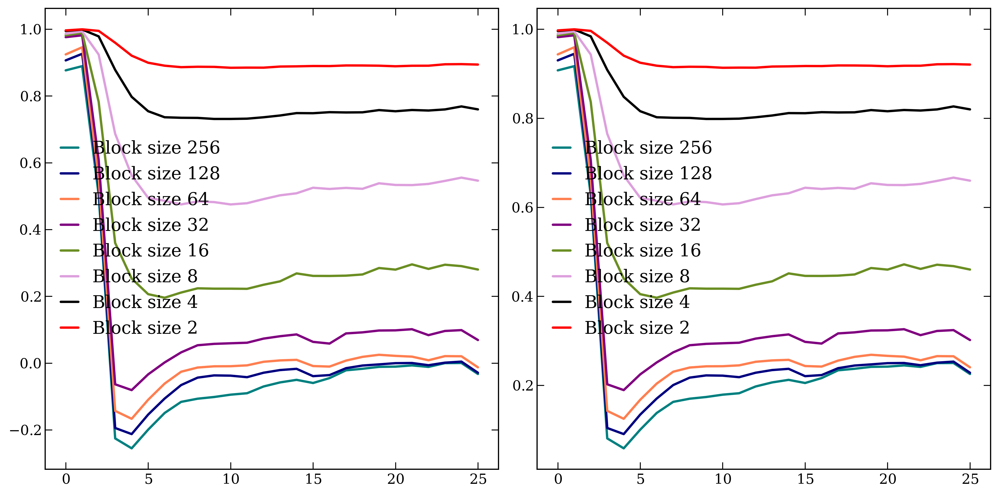

In [128]:

path28 = data_dirs[1]
Nframes = len(os.listdir(path28)) - 2


ar28 = mp.archive.loadarchive(path28)
LX = ar28.LX
LY = ar28.LY
block_list = [int((LX / 2**n)) for n in range(1, 9)]

s_list = np.nan * np.zeros((Nframes, len(block_list)))
s_list2 = np.nan * np.zeros((Nframes, len(block_list)))
avdir_list = []
direction_list = []
angle_diff_list = []
qav_list = []
for i in range(Nframes):
    frame = ar28._read_frame(i)
    Qxx_dat = frame.QQxx.reshape(LX, LY)
    Qyx_dat = frame.QQyx.reshape(LX, LY)

    #defects = mp.nematic.nematicPy.get_defects(Qxx_dat, Qyx_dat, LX, LY)
    S, nx, ny = mp.nematic.nematicPy.get_director(Qxx_dat, Qyx_dat)


    direction = np.arctan(ny/nx).flatten()


    maskm = (direction < 0)
    n_norm = np.sqrt(nx**2 + ny**2)
    nx_norm = nx / n_norm
    ny_norm = ny / n_norm

    nx_av = nx_norm.flatten().mean()
    ny_av = ny_norm.flatten().mean()

    n_av_norm = np.sqrt(nx_av**2 + ny_av**2)
    nx_av = nx_av / n_av_norm
    ny_av = ny_av / n_av_norm

    av_direction = np.arctan(ny_av / nx_av)

    av_direction2 = np.mean(direction)   
    rel_angle = av_direction - direction
    order_param = (2* np.cos(rel_angle)**2 - 1)
    order_param2 = (2* np.cos(av_direction2 - direction)**2 - 1)

    for j, block_size in enumerate(block_list):
        s_list[i, j] = calc_order_param2(nx, ny, block_size = block_size).mean()
        s_list2[i, j] = calc_order_param2(nx, ny, block_size = block_size, use_2d_form=False).mean()

   # s = calc_order_param(direction)

    angle_diff_list.append(order_param)
    direction_list.append(direction)
    avdir_list.append(av_direction)
   # s_list.append(order_param.mean())
   # qav_list.append(order_param2.mean())


fig, ax = plt.subplots(ncols=2, figsize = (12, 6))
for i, block in enumerate(block_list):
    ax[0].plot(s_list[:, i], label = f'Block size {block}')
    ax[1].plot(s_list2[:, i], label = f'Block size {block}')

#ax.plot(s_list, 'o-')
#ax.plot(qav_list, 'o-')
ax[0].legend()  
ax[1].legend()


In [ ]:

ncols=3
nrows = Nframes // ncols +1
fig, ax = plt.subplots(ncols=ncols,nrows=nrows,figsize=(12,3*nrows))
ax = ax.flatten() 
for i in range(Nframes):
    ax[i].hist(angle_diff_list[i].flatten(), bins=30)
    ax[i].set_title(f'Frame = {i},')
#plt.hist(direction_list[3].flatten(), bins=30) ;

-0.003791571702794922
0.882999805957779
-0.8824807314642116


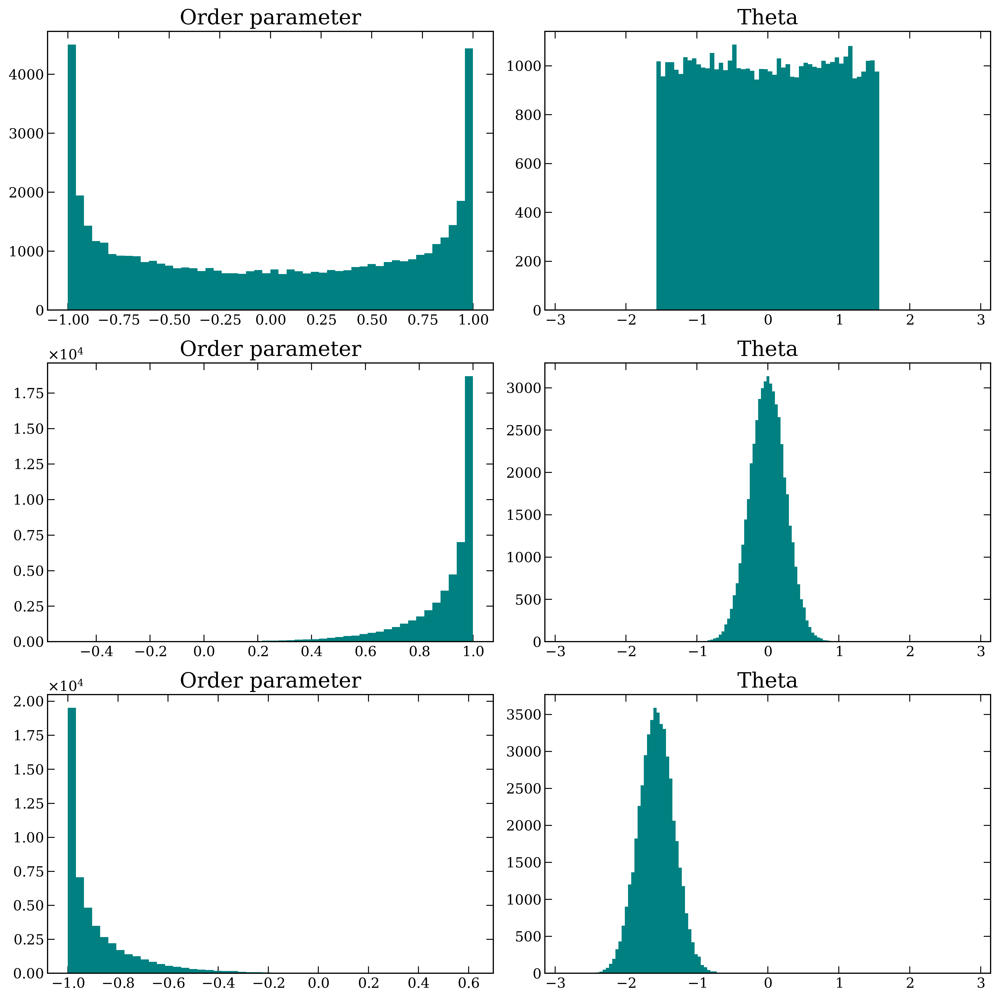

In [172]:
# generate 10000 uniform points in the unit circle
#r = np.random.rand(10000)
#theta = np.pi*np.random.rand(50000) - np.pi/2


theta_rand = np.pi*np.random.rand(50000) - np.pi/2
theta_align = np.random.normal(0, 0.25, 50000)
theta_anti_align = np.random.normal(-np.pi/2, 0.25, 50000)

order_param_rand = (2* np.cos(theta_rand)**2 - 1) 
order_param_align = (2* np.cos(theta_align)**2 - 1)
order_param_anti_align = (2* np.cos(theta_anti_align)**2 - 1)
#order_param = np.cos(theta)**2 #* np.sin(theta)


fig, ax = plt.subplots(ncols=2, nrows = 3,figsize=(12,12))    
ax = ax.flatten()

for i, (theta, order_param) in enumerate(zip([theta_rand, theta_align, theta_anti_align], [order_param_rand, order_param_align, order_param_anti_align])):
    ax[2*i].hist(order_param, bins=50)
    ax[2*i].set_title('Order parameter')
    ax[2*i+1].hist(theta, bins=50)
    ax[2*i+1].set_title('Theta')
    ax[2*i+1].set_xlim(-np.pi, np.pi)

#ax[0].hist(order_param, bins=50)
#ax[1].hist(theta, bins=50);
    print(order_param.mean())


In [ ]:
ncols=3
nrows = Nframes // ncols +1
fig, ax = plt.subplots(ncols=ncols,nrows=nrows,figsize=(12,3*nrows))
ax = ax.flatten() 
for i in range(Nframes):
    ax[i].hist(direction_list[i].flatten(), bins=100)
    ax[i].set_title(f'Frame = {i},')
#plt.hist(direction_list[3].flatten(), bins=30) ;

In [ ]:
fig, ax = plt.subplots(ncols=2,nrows=3,figsize=(12,12))
ax = ax.flatten() 
for i in range(5):
    j= i+10
    frame = ar28._read_frame(j)
    Qxx_dat = frame.QQxx.reshape(LX, LY)
    Qyx_dat = frame.QQyx.reshape(LX, LY)
    director(frame=frame, Qxx=Qxx_dat, Qyx=Qyx_dat, engine=ax[i], scale=False, avg=2, ms=.7, alpha=.8, lw=.7)
    ax[i].set_aspect('equal')
    ax[i].set(xlim=[0,LX], ylim=[0,LY])
    ax[i].set_title(f'Frame: {j}')


In [11]:
frame_dict = {}
for i, dirr in enumerate(paths):
    ar = mp.archive.loadarchive(dirr)


    frame = ar._read_frame(0)
    LX = ar.LX
    LY = ar.LY 
    frame_dict[act_list[i]] = frame

    if 0:
        Qxx_dat = frame.QQxx.reshape(LX, LY)
        Qyx_dat = frame.QQyx.reshape(LX, LY)

        #defects = mp.nematic.nematicPy.get_defects(Qxx_dat, Qyx_dat, LX, LY)
        S, nx, ny = mp.nematic.nematicPy.get_director(Qxx_dat, Qyx_dat)

        direction = np.arctan(ny/nx).flatten()

        maskp = (direction > np.pi /2)
        maskm = (direction < -np.pi /2)

        direction[maskp] = direction[maskp] - np.pi/2
        direction[maskm] = direction[maskm] + np.pi/2

        av_direction = np.mean(direction)   
        s = calc_order_param(direction)

In [18]:
frame_dict.values()

dict_values([<massPy.archive.Archive._read_frame.<locals>.FrameHolder object at 0x00000246E1BF8850>, <massPy.archive.Archive._read_frame.<locals>.FrameHolder object at 0x00000246DABAB9A0>, <massPy.archive.Archive._read_frame.<locals>.FrameHolder object at 0x00000246DC7886D0>, <massPy.archive.Archive._read_frame.<locals>.FrameHolder object at 0x00000246DC7881F0>, <massPy.archive.Archive._read_frame.<locals>.FrameHolder object at 0x00000246E1BF8280>])

Text(0.5, 0, 'Activity')

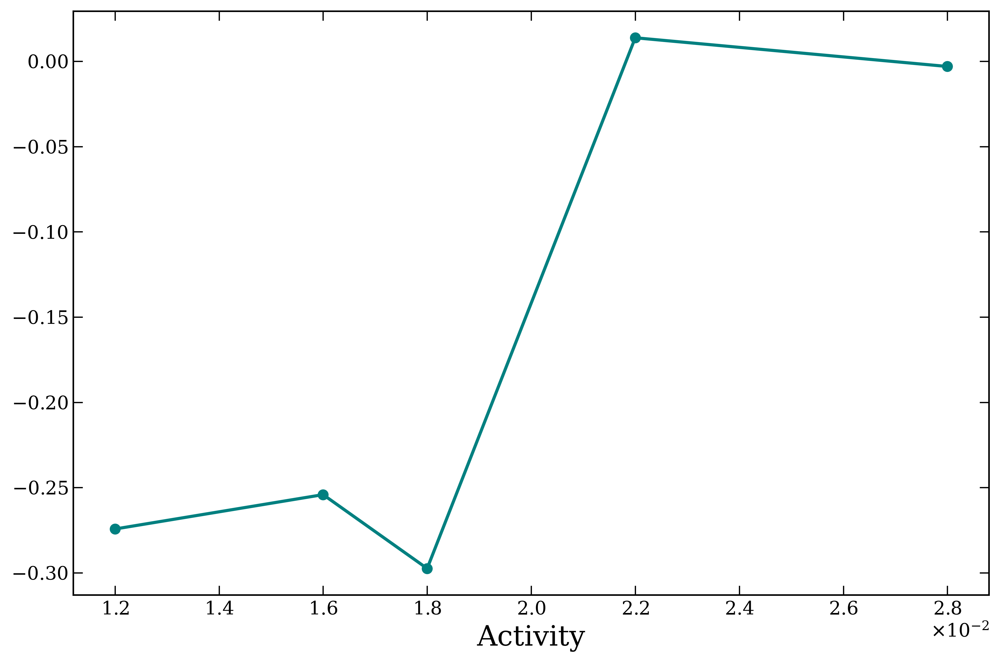

In [169]:
s_list = []
avdir_list = []
direction_list = []
for i, frame in enumerate(frame_dict.values()):
    Qxx_dat = frame.QQxx.reshape(LX, LY)
    Qyx_dat = frame.QQyx.reshape(LX, LY)

    #defects = mp.nematic.nematicPy.get_defects(Qxx_dat, Qyx_dat, LX, LY)
    S, nx, ny = mp.nematic.nematicPy.get_director(Qxx_dat, Qyx_dat)

    direction = np.arctan(ny/nx).flatten()


    n_norm = np.sqrt(nx**2 + ny**2)
    nx_norm = nx / n_norm
    ny_norm = ny / n_norm

    nx_av = nx_norm.flatten().mean()
    ny_av = ny_norm.flatten().mean()

    n_av_norm = np.sqrt(nx_av**2 + ny_av**2)
    nx_av = nx_av / n_av_norm
    ny_av = ny_av / n_av_norm

    av_direction = np.arctan(ny_av / nx_av)

    #av_direction = np.mean(direction)   
    rel_angle = av_direction - direction
    order_param = (2* np.cos(rel_angle)**2 - 1)

    #direction[maskp] = direction[maskp] - np.pi/2
    #direction[maskm] = direction[maskm] + np.pi #/2

    av_direction = np.mean(direction)   
    s = calc_order_param(direction)

    direction_list.append(direction)
    avdir_list.append(av_direction)
    s_list.append(order_param.mean())

fig, ax = plt.subplots()
ax.plot(act_list, s_list, 'o-')
ax.set_xlabel('Activity')

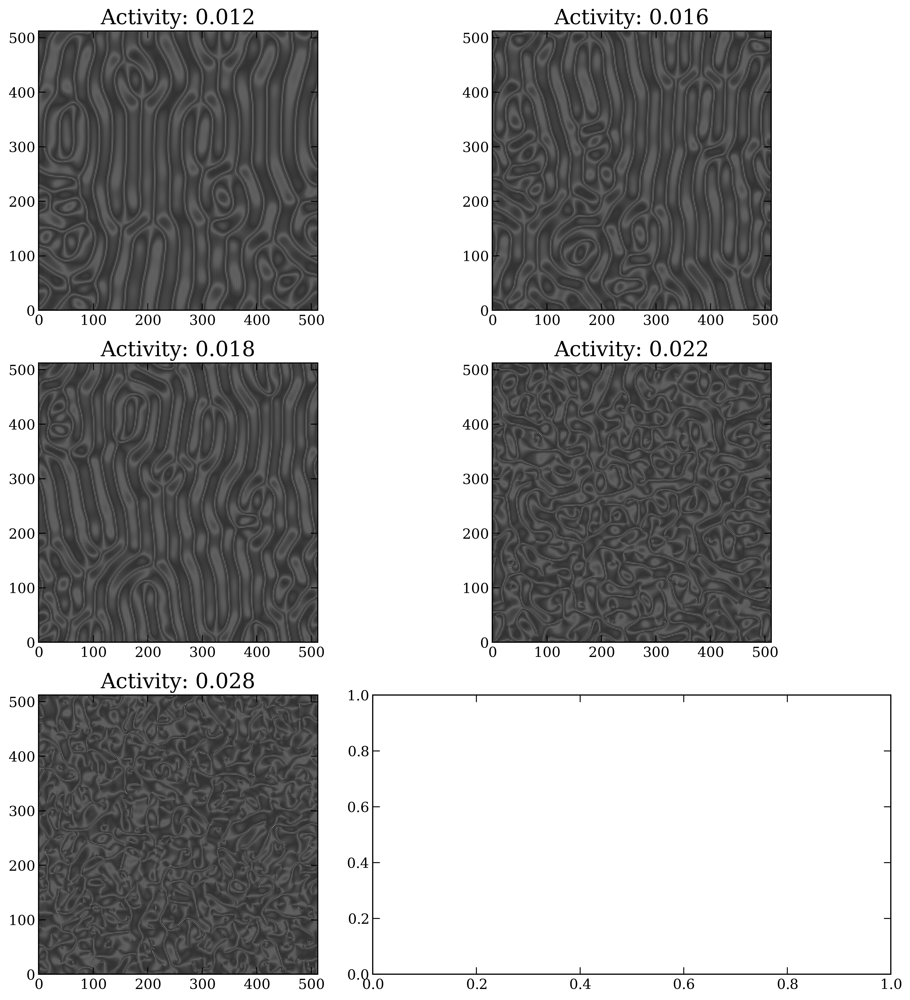

In [29]:
fig, ax = plt.subplots(ncols=2,nrows=3,figsize=(12,12))
ax = ax.flatten() 
for i, frame in enumerate(frame_dict.values()):
    Qxx_dat = frame.QQxx.reshape(LX, LY)
    Qyx_dat = frame.QQyx.reshape(LX, LY)
    director(frame=frame, Qxx=Qxx_dat, Qyx=Qyx_dat, engine=ax[i], scale=False, avg=2, ms=.7, alpha=.8, lw=.7)
    ax[i].set_aspect('equal')
    ax[i].set(xlim=[0,LX], ylim=[0,LY])
    ax[i].set_title(f'Activity: {act_list[i]}')


In [ ]:
path = 'C:\\Users\\Simon Andersen\\Dokumenter\\Uni\\Speciale\\Hyperuniformity\\nematic_data'

data_dirs = os.listdir(path)
data_dirs = [os.path.join(path, d) for d in data_dirs]

paths = [data_dirs[7], data_dirs[9], data_dirs[10], data_dirs[11]] #, data_dirs[3]]
act_list = [19, 0.0205, 0.021, 0.022] #, 0.028, 0.06]
